In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.preprocessing import LabelEncoder
from category_encoders import TargetEncoder
import plotly.express as px

In [3]:
X_train = pd.read_parquet("../data/processed/x_train.parquet", engine="auto")
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1629 entries, 393 to 837
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   talk_time      1629 non-null   int64  
 1   battery_power  1629 non-null   int64  
 2   pc             1629 non-null   int64  
 3   three_g        1629 non-null   int64  
 4   mobile_wt      1629 non-null   int64  
 5   px_width       1629 non-null   int64  
 6   sc_h           1629 non-null   int64  
 7   sc_w           1629 non-null   int64  
 8   m_dep          1629 non-null   float64
 9   touch_screen   1629 non-null   int64  
 10  four_g         1629 non-null   int64  
 11  blue           1629 non-null   int64  
 12  n_cores        1629 non-null   int64  
 13  wifi           1629 non-null   int64  
 14  dual_sim       1629 non-null   int64  
 15  ram            1629 non-null   int64  
 16  int_memory     1629 non-null   int64  
 17  px_height      1629 non-null   int64  
 18  clock_s

In [4]:
X_train["wifi"]          = X_train["wifi"].astype('category')
X_train["blue"]          = X_train["blue"].astype('category')
X_train["dual_sim"]      = X_train["dual_sim"].astype('category')
X_train["touch_screen"]  = X_train["touch_screen"].astype('category')
X_train["three_g"]       = X_train["three_g"].astype('category')
X_train["four_g"]        = X_train["four_g"].astype('category')

X_train["wifi"] = LabelEncoder().fit_transform(X_train["wifi"])
X_train["blue"] = LabelEncoder().fit_transform(X_train["blue"])
X_train["dual_sim"] = LabelEncoder().fit_transform(X_train["dual_sim"])
X_train["touch_screen"] = LabelEncoder().fit_transform(X_train["touch_screen"])
X_train["three_g"] = LabelEncoder().fit_transform(X_train["three_g"])
X_train["four_g"] = LabelEncoder().fit_transform(X_train["four_g"])

In [5]:
y_train = pd.read_csv("../data/interim/y_train.csv")
y_train        = y_train.astype('category')

In [6]:
# import pandas profilling lib
from pandas_profiling import ProfileReport
profile3 = ProfileReport(X_train, title="Diabetes data Profiling Report 3" )
profile3.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
profile3.to_file("../reports/CellPhoneDs_profiling_bivariate_report_3.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# MODELS

## Evaluation Metric

The selected evaluation metric is the 
> **Recall - Sensitivity**

<font color='yellow'>
A False Negative might delay more tests or treatment, 
however a False Positive may just lead to more tests or treatments – not as costly as putting a life at stake.
</font>

In [8]:
# Evaluation
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

Interpretability is important so first intents will be with classic Machine Learning Models, No ensembles, No Neural Networks

In [9]:
# Selected algorithms
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

## Model Selection

In [10]:
seed =2
models = []

#logistic Regression
models.append(('KNN', KNeighborsClassifier(n_neighbors=4)))

# Decision Tree classifier
models.append(('CART', DecisionTreeClassifier()))

# Naïve Bayes
models.append(('NB', GaussianNB()))
# cluster
models.append(('RF', RandomForestClassifier()))
# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'
for name, model in models:
	# Kfol cross validation for model selection
	kfold = model_selection.KFold(n_splits=10, shuffle=True)
	#X train , y train
	cv_results = model_selection.cross_val_score(model, X_train, y_train.values.ravel(), cv=kfold, scoring = scoring)
	results.append(cv_results)
	names.append(name)
	msg = f"({name}, {cv_results.mean()}, {cv_results.std()})"
	print(msg)

(KNN, 0.9165076119063847, 0.023813401287481495)
(CART, 0.8520449897750512, 0.03381985888062455)
(NB, 0.8029500871014165, 0.03484057497637127)
(RF, 0.8944255093539347, 0.02186784279532851)


## Results

In [11]:
result_df = pd.DataFrame(results, index=names).T
px.box(result_df,title = 'Algorithm Comparison')

# Hyper Parameter optimization

Check if GaussianNB get better results knowing the prior distribution of the classes

In [12]:
from sklearn.model_selection import GridSearchCV

In [13]:
#priors calculation
y_train.value_counts()/len(y_train)
a, b, c, d = y_train.value_counts()/len(y_train)

In [14]:
parameters = {'priors': [None, [a, b, c, d]]}

grid_search = GridSearchCV(GaussianNB(), parameters, cv=10, return_train_score=True)
grid_search.fit(X_train, y_train.values.ravel())

grid_search.best_params_

{'priors': None}

the prior statistical information computed by the model is very similar to the one calculated by hand using the whole dataset information

# Final evaluation Test set

In [15]:
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import plot_precision_recall_curve

In [16]:
X_test = pd.read_parquet("../data/interim/x_test.parquet", engine="auto")
X_test.drop(['hgv', 'fc'],axis=1,inplace=True)

In [17]:
y_test = pd.read_csv("../data/interim/y_test.csv")
y_test        = y_test.astype('category')

## Random Forest

In [18]:
RF = RandomForestClassifier()
RF.fit(X_train,y_train.values.ravel())
y_pred = RF.predict(X_test)

In [19]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.93      0.94      0.93       173
         1.0       0.88      0.88      0.88       175
         2.0       0.89      0.88      0.89       173
         3.0       0.94      0.94      0.94       178

    accuracy                           0.91       699
   macro avg       0.91      0.91      0.91       699
weighted avg       0.91      0.91      0.91       699



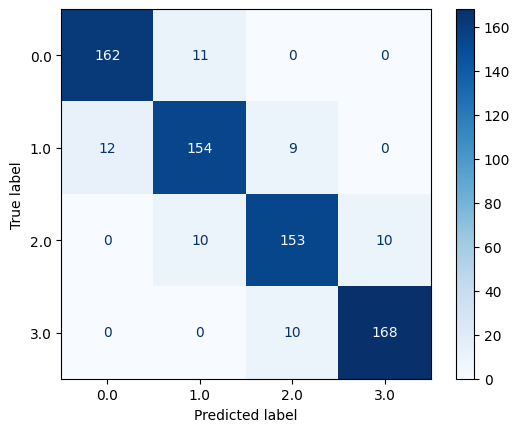

In [20]:
cm = confusion_matrix(y_test, y_pred, labels=RF.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=RF.classes_, )
disp.plot(cmap=plt.cm.Blues)
plt.show()

In [21]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['log2', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [23]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train.values.ravel())

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   3.7s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   4.3s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=400; total time=   4.5s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=1200; total time=  11.8s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=  19.7s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000; total time=  19.0s
[CV] END bootstrap=True, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=2000;

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['log2', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)